# PROJET TI: Quantification vectorielle des images

**Bellili Fouad, Sourdrille Nathan, ITI4.**

# Introduction

Ce notebook présente et met en œuvre la **quantification vectorielle d'images**, en s'appuyant sur les notions de quantification scalaire vues en cours de TI, puis en les généralisant à des blocs de pixels (vecteurs).  

En cours de TI, on voit principalement la **quantification scalaire** dans le cadre de la numérisation d'un signal (conversion analogique–numérique, résolution, erreur de quantification, SNR…).

## Rappels sur la quantification scalaire

Dans la chaîne de numérisation vue en cours de TI, la quantification scalaire vient après l'échantillonnage : on dispose d'échantillons numériques de grande précision (ou d'un signal analogique modulé) et on veut les ramener à un ensemble fini de niveaux.  

On remplace chaque échantillon $x$ par une valeur parmi les $L$ niveaux suivants :  

$$
\{q_1, q_2, \dots, q_L\}.
$$  

Dans le cas d'une image sur 8 bits (pixels dans $[0,255]$), une **quantification uniforme** sur $L$ niveaux peut se faire en appliquant :

$$
\hat{x} = \operatorname{round}\left( \frac{x}{255}(L-1) \right)\frac{255}{L-1}.
$$

L'erreur de quantification est :

$$
e = x - \hat{x}.
$$

Sur l'ensemble des pixels, on définit la MSE (Mean Squared Error) :

$$
\mathrm{MSE} = \frac{1}{N}\sum_{i=1}^N (x_i - \hat{x}_i)^2,
$$

et le PSNR (Peak Signal-to-Noise Ratio) :

$$
\mathrm{PSNR} = 10\log_{10}\left(\frac{255^2}{\mathrm{MSE}}\right).
$$

**PSNR (Peak Signal-to-Noise Ratio)**: mesure qui permet d’évaluer la qualité d’une image reconstruite ou compressée en la comparant à l’image originale.
- PSNR élevé → bonne qualité, faible compression.
- PSNR faible → mauvaise qualité, forte compression.

**MSE (Mean Squared Error)**: erreur quadratique moyenne entre l’image originale et l’image reconstruite.
- MSE faible -> meilleur reconstruction.
- MNE élevé -> moins bonne reconstruction.

In [1]:
# Librairies
from sklearn.metrics import mean_squared_error
from sklearn.cluster import KMeans
import math
import matplotlib.pyplot as plt
import cv2
import numpy as np
import time

La fonction *compute_mse* calcule le MSE de l'image.

In [2]:
def compute_mse(original, reconstructed):
    return np.mean((original - reconstructed) ** 2)

La fonction *compute_psnr* calcule le PSNR à partir du MSE pour mesurer la qualité de reconstruction entre l’image originale et l’image reconstruite.

In [3]:
def compute_psnr(original, reconstructed):
    m = compute_mse(original, reconstructed)
    if m < 1e-10: # cas où MSE = 0 ou quasi 0
        return float('60')
    return 20 * math.log10(255.0 / math.sqrt(m))

La fonction *quantification_scalaire_uniforme* réalise une quantification scalaire uniforme en ramenant l’image à L niveaux d’intensité puis en la reconstruisant à partir de ces niveaux.

In [4]:
def quantification_scalaire_uniforme(image, L):
    """Quantification scalaire uniforme sur L niveaux."""
    img_norm = image / 255.0
    img_q = np.round(img_norm * (L - 1))
    img_rec = img_q * (255.0 / (L - 1))
    return img_rec.astype(np.float32)

Appliquons cette quantification scalaire à notre image de réféfence:

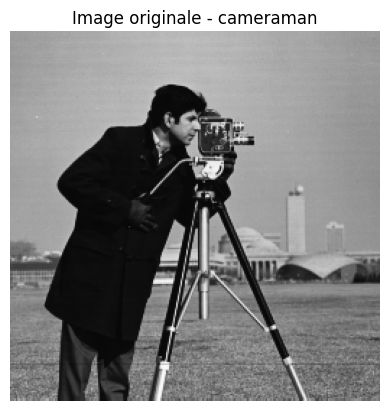

In [5]:
img = cv2.imread("images/cameraman.tif", cv2.IMREAD_GRAYSCALE).astype(np.float32)

plt.figure()
plt.imshow(img, cmap="gray", vmin=0, vmax=255)
plt.title("Image originale - cameraman")
plt.axis("off")
plt.show()

L= 2 -> MSE= 7286.38, PSNR= 9.51 dB
L= 4 -> MSE=  414.03, PSNR=21.96 dB
L= 8 -> MSE=  127.87, PSNR=27.06 dB
L=16 -> MSE=   24.88, PSNR=34.17 dB


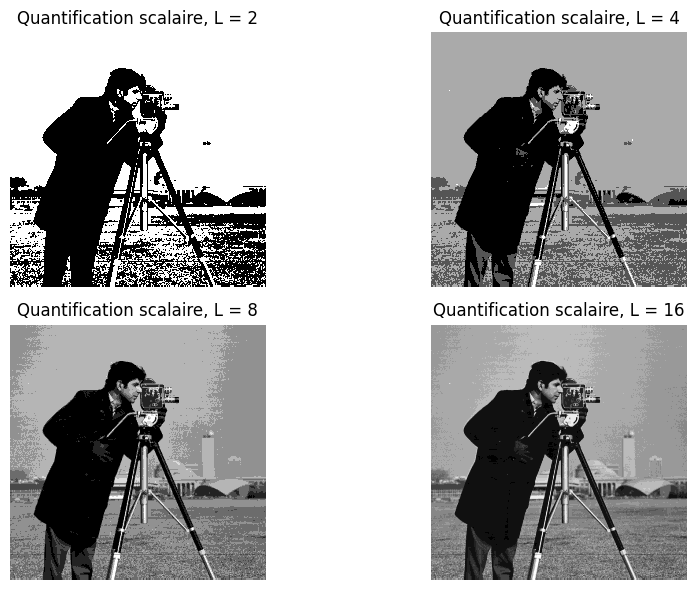

In [6]:
levels = [2, 4, 8, 16]
for L in levels:
    img_q = quantification_scalaire_uniforme(img, L)
    print(f"L={L:2d} -> MSE={compute_mse(img, img_q):8.2f}, PSNR={compute_psnr(img, img_q):5.2f} dB")

plt.figure(figsize=(10, 6))
for i, L in enumerate(levels):
    img_q = quantification_scalaire_uniforme(img, L)
    plt.subplot(2, 2, i+1)
    plt.imshow(img_q, cmap="gray", vmin=0, vmax=255)
    plt.title(f"Quantification scalaire, L = {L}")
    plt.axis("off")
plt.tight_layout()
plt.show()

Lorsque le nombre de niveaux L est très faible (2 ou 4), l'image est fortement dégradée, avec des aplats de gris et une forte perte de détails. A partir de L=8, la reconstruction devient plus lisible, et avec L=16, l'image se rapproche visuellement de l'originale. Plus L augmente, meilleure est la qualité.  
Cependant, ces résultats démontrent les limites de la quantification scalaire qui traite chaque pixel indépendamment et ne tient pas compte des structures locales de l’image, ce qui entraîne rapidement une forte perte de qualité pour des niveaux faibles.

Dans ce projet, on va plus loin en étudiant la **quantification vectorielle (QV)**.

# Principe de la quantification vectorielle

La **quantification vectorielle (Vector Quantization)** est une technique utilisée dans le codage d'images pour **réduire la quantité de données nécessaires à la représentation d'une image tout en maintenant une qualité acceptable**. Elle repose sur la conception d'un dictionnaire, appelé *codebook*, qui contient un ensemble de vecteurs représentatifs. L'image est ensuite compressée en remplaçant des blocs d'images par les vecteurs du codebook les plus proches, ce qui permet une compression efficace.
Contrairement à la **quantification scalaire** (qui traite chaque pixel individuellement), la VQ regroupe des pixels en blocs multidimensionnels, ce qui permet:
- une meilleure exploitation des corrélations spatiales présentent dans l’image.
- une meilleure représentation des motifs locaux (textures, bords, etc).
- d’obtenir de meilleurs taux de compression.
- d’être utilisée dans diverses applications de compression d’images, de vidéos ou de signaux vocaux.

Les algorithmes de quatification vectorielle suivent tous le même principe, composé de 4 étapes principales:

1) **Découpage en vecteurs**:  
L’image est divisée en blocs de taille fixe (par exemple 4×4 pixels, soit des vecteurs de dimension 16). **Chaque bloc est interprété comme un vecteur de ℝⁿ**. Le choix de la taille des blocs influence la qualité, la complexité et le taux de compression.

3) **Construction du codebook**:  
Lorsque l’on découpe l’image en blocs, beaucoup d’entre eux se ressemblent fortement. Plutôt que de conserver tous ces blocs, ce qui serait redondant et coûteux,  on regroupe les blocs similaires et l’on garde un seul bloc représentatif pour chaque groupe.  
Ce bloc représentatif est appelé un codeword et l'ensemble des K codewords forme le **codebook (C): un dictionnaire de K vecteurs représentatifs**. On a: $$
\mathcal{C} = \{c_1, c_2, \dots, c_K\}, \quad c_k \in \mathbb{R}^d
$$ Ce regroupement est généralement réalisé via un algorithme de clustering, notamment K-means/LBG. Le codebook peut-être:
- fixe: défini manuellement, les codewords sont choisis à l’avance et ne dépendent pas de l’image à compresser.
- appris automatiquement: obtenu en regroupant les blocs similaires de l’image, les codewords sont alors les blocs moyens représentatifs de chaque groupe.


3) **Codage**:  
Pour chaque vecteur bloc $v$ de l’image:
- on mesure sa distance (euclidienne généralement) à chacun des codewords du codebook.
- on choisit l'indice du codeword le plus proche, c'est à dire celui qui ressemble le plus au bloc.
- on remplace le bloc par l'index du codeword le plus ressemblant.  
On a: $$
k^* = \arg\min_{k} \|v - c_k\|^2.
$$

On ne stocke que l'indice $k^*$.  
Ainsi, comme un index occupe très peu de mémoire par rapport à un bloc entier (log₂(K) bits), le stockage est beaucoup plus compact.  

4) **Décodage**:  
Il s'agit naturellement de l'opération inverse du codage. Pour chaque bloc compressé, on ne dispose plus du bloc original mais uniquement de l’index du codeword qui lui avait été associé. Le décodeur utilise cet index pour aller chercher dans le codebook le codeword correspondant, puis le replace à l’emplacement du bloc dans l’image tel que: $$
\hat{v} = c_{k^*}.
$$
En répétant cette opération pour tous les indices, on reconstruit progressivement l’image complète. L’image obtenue est généralement une approximation de l’image originale, car chaque bloc a été remplacé par un bloc représentatif issu du codebook.

# Méthodes de quantification vectorielle

Plusieurs algorithmes permettent de réaliser la quantification vectorielle. Nous présentons les principaux et implémentons intégralement les algorithmes LBG et K-means, parmi les plus couramment utilisés.

## Algorithme LBG (Linde–Buzo–Gray) 

L’algorithme LBG est une **extension du K-means** spécifiquement conçue pour la quantification vectorielle.
Bien que K-means seul puisse être utilisé pour apprendre un codebook, son initialisation aléatoire peut conduire à des solutions de mauvaise qualité (mauvaise répartition des centres, convergence vers des minima locaux, centres inutilisés, etc.).

Pour éviter ces problèmes, LBG propose une stratégie d’apprentissage progressive, structurée et plus stable, qui permet d’obtenir des codebooks de meilleure qualité. Il introduit une étape de "Split".

LBG est ainsi la méthode la plus connue et la plus utilisée pour construire un codebook à partir de l’image.
Son fonctionnement repose sur cinq étapes principales : 

1) **Initialisation**:  
On commence avec un unique codeword initial, calculé comme la moyenne de tous les blocs de l’image. Ce centre global résume grossièrement l’ensemble des données et sert de point de départ.

2) **Split**:  
Afin d’augmenter progressivement la taille du codebook, chaque codeword est dupliqué en deux versions légèrement différentes: l’une est décalée vers le haut (+ε), l'autre vers le bas (-ε), avec ε très petit. Ainsi, un codeword donne naissance à deux centres proches.Cette opération double le nombre total de codewords, jusqu’à atteindre la taille souhaitée K. Ce split permet d’initialiser les centres de manière contrôlée, évitant l’aléatoire du K-means.

3) **Clustering (assignation des blocs)**:  
Une fois les centres dédoublés, on applique la logique du K-means :
pour chaque bloc de l’image, on recherche le codeword le plus proche (souvent avec la distance euclidienne). Les blocs sont alors répartis dans K groupes ou clusters.

4) **Mise à jour des codewords**:  
Pour chaque cluster, on recalcule un nouveau codeword comme la moyenne des blocs qui lui sont assignés. Ce codeword est donc un bloc représentatif (centroïde) des blocs de son groupe.

5) **Itération jusqu’à stabilisation**:  
Les étapes 3 et 4 sont répétées successivement et l'algorithme s'arrête lorsque les codewords ne changent presque plus, c'est à dire que la distrosion globale n'évolue plus.  
distorsion = l’erreur totale entre tous les blocs de l’image et les codewords auxquels ils sont assignés.  
Si le nombre final de codewords n’est pas encore atteint (par exemple si l’on est passé de 4 à 8 mais que l’objectif est 16), on retourne à l’étape Split, et le processus recommence.

Cependant, pour observer la différence réel entre LBG et K-means, on implémente dans un premier temps l'algorithme K-means, qui suit les étapes ci-dessus, hormis celle de Split.

La fonction *chronometrer* mesure et affiche le temps d’exécution d'un algorithme.

In [7]:
def chronometrer(fonction, fonction_name, *args_fonction, **kwargs_fonction):
    t_before = time.time()
    output = fonction(*args_fonction, **kwargs_fonction)
    t_after = time.time()
    print(f"Temps d'exécution de {fonction_name} : {t_after - t_before:.2f} sec")
    return output

### K-means

**Choix du paramètre K et de la taille des blocs**

La taille du codebook K n’est pas fixée théoriquement ; elle dépend du compromis entre compression et qualité. Ainsi, on test plusieurs valeurs de K (de 16 à 1024) et on évalue la qualité de reconstruction via le PSNR.  

La fonction *test_kmeans_on_image* applique K-means à différentes valeurs de K sur une image et calcule pour chacune le MSE et le PSNR afin d’évaluer la qualité de reconstruction.

In [8]:
def test_kmeans_on_image(img_name, block_sizes, K_values, img_folder="images/"):
    
    img_original = cv2.imread(img_folder + img_name, cv2.IMREAD_GRAYSCALE).astype(np.float32)
    results = []   

    for block_size in block_sizes:
        print(f"\nTests pour block_size={block_size}\n")

        img = img_original.copy()
        h, w = img.shape

        h_crop = h - (h % block_size)
        w_crop = w - (w % block_size)
        img_crop = img[:h_crop, :w_crop]

        blocks = [
            img_crop[i:i+block_size, j:j+block_size].flatten()
            for i in range(0, h_crop, block_size)
            for j in range(0, w_crop, block_size)
        ]

        vectors = np.array(blocks)

        for K in K_values:
            print(f"Pour K={K}")

            kmeans = KMeans(n_clusters=K, random_state=0).fit(vectors)
            labels = kmeans.predict(vectors)
            reconstructed_vectors = kmeans.cluster_centers_[labels]

            img_rec = np.zeros_like(img_crop)
            idx = 0
            for i in range(0, h_crop, block_size):
                for j in range(0, w_crop, block_size):
                    img_rec[i:i+block_size, j:j+block_size] = \
                        reconstructed_vectors[idx].reshape(block_size, block_size)
                    idx += 1

            mse = mean_squared_error(img_crop.flatten(), img_rec.flatten())
            quality = compute_psnr(img_crop, img_rec)

            print(f"MSE={mse:.4f} | PSNR={quality:.2f} dB")

            results.append((block_size, K, mse, quality))

    return results


In [9]:
block_sizes = [2, 4, 8]
K_values = [16, 32, 64, 128, 256, 512, 1024]

results = test_kmeans_on_image(
    img_name="cameraman.tif",
    block_sizes=block_sizes,
    K_values=K_values
)


Tests pour block_size=2

Pour K=16
MSE=130.6668 | PSNR=26.97 dB
Pour K=32
MSE=83.9930 | PSNR=28.89 dB
Pour K=64
MSE=56.3737 | PSNR=30.62 dB
Pour K=128
MSE=36.5820 | PSNR=32.50 dB
Pour K=256
MSE=23.4196 | PSNR=34.44 dB
Pour K=512
MSE=13.9969 | PSNR=36.67 dB
Pour K=1024
MSE=7.4353 | PSNR=39.42 dB

Tests pour block_size=4

Pour K=16
MSE=296.6613 | PSNR=23.41 dB
Pour K=32
MSE=229.8555 | PSNR=24.52 dB
Pour K=64
MSE=167.4629 | PSNR=25.89 dB
Pour K=128
MSE=117.9290 | PSNR=27.41 dB
Pour K=256
MSE=74.4075 | PSNR=29.41 dB
Pour K=512
MSE=37.7738 | PSNR=32.36 dB
Pour K=1024
MSE=12.6636 | PSNR=37.11 dB

Tests pour block_size=8

Pour K=16
MSE=521.9126 | PSNR=20.95 dB
Pour K=32
MSE=402.6045 | PSNR=22.08 dB
Pour K=64
MSE=291.6732 | PSNR=23.48 dB
Pour K=128
MSE=147.8795 | PSNR=26.43 dB
Pour K=256
MSE=47.5675 | PSNR=31.36 dB
Pour K=512
MSE=3.1815 | PSNR=43.10 dB
Pour K=1024
MSE=0.0000 | PSNR=60.00 dB


On peut le voir graphiquement:

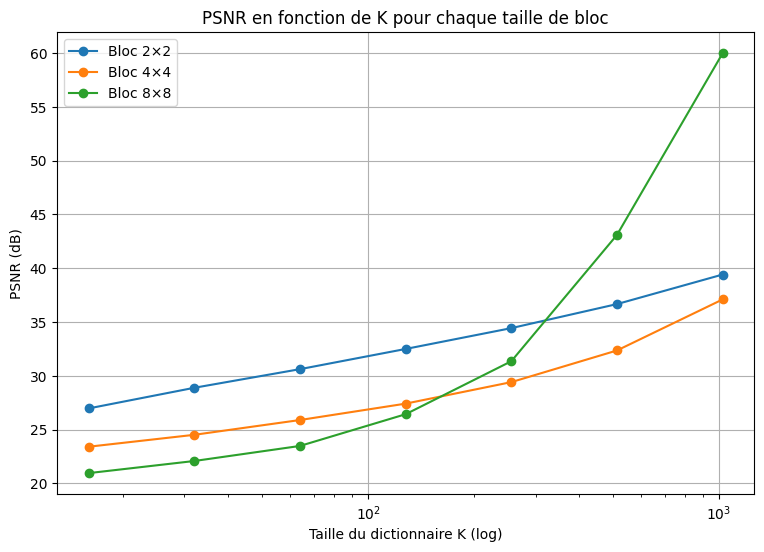

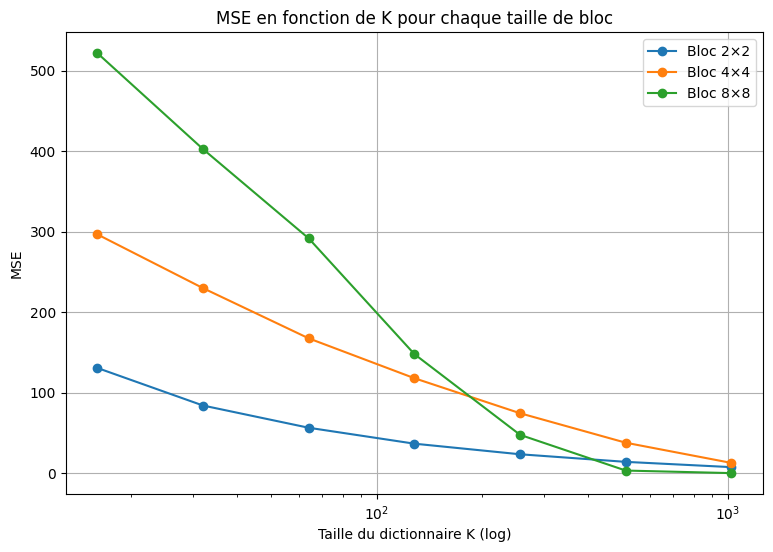

In [10]:
results_by_block = {}
for b, K, mse, psnr in results:
    if b not in results_by_block:
        results_by_block[b] = {"K": [], "MSE": [], "PSNR": []}
    results_by_block[b]["K"].append(K)
    results_by_block[b]["MSE"].append(mse)
    results_by_block[b]["PSNR"].append(psnr)

plt.figure(figsize=(9,6))
for b in results_by_block:
    plt.plot(results_by_block[b]["K"],
             results_by_block[b]["PSNR"],
             marker='o',
             label=f"Bloc {b}×{b}")

plt.xscale("log")
plt.xlabel("Taille du dictionnaire K (log)")
plt.ylabel("PSNR (dB)")
plt.title("PSNR en fonction de K pour chaque taille de bloc")
plt.grid(True)
plt.legend()
plt.show()

plt.figure(figsize=(9,6))
for b in results_by_block:
    plt.plot(results_by_block[b]["K"],
             results_by_block[b]["MSE"],
             marker='o',
             label=f"Bloc {b}×{b}")

plt.xscale("log")
plt.xlabel("Taille du dictionnaire K (log)")
plt.ylabel("MSE")
plt.title("MSE en fonction de K pour chaque taille de bloc")
plt.grid(True)
plt.legend()
plt.show()

Les courbes MSE et PSNR montrent que l’augmentation de K améliore systématiquement la qualité de reconstruction, mais avec un rendement décroissant. Cet effet varie fortement selon la taille des blocs utilisés. On observe un point de coude autour de K ≈ 128–256, où la qualité devient déjà très bonne tout en conservant un temps de calcul acceptable. Au-delà de K = 256, les gains visuels supplémentaires deviennent faibles, alors que le coût computationnel augmente fortement.
Ainsi, le choix de K résulte d’un compromis entre qualité souhaitée, temps d’apprentissage et niveau de compression visé.

Un PSNR supérieur à 40-45 dB signifie: 
- une erreur quadratique très faible.
- une reconstruction quasiment indiscernable de l’image original.
- un codebook de haute qualité.

L’augmentation de K entraîne une reconstruction:
- plus précise.
- plus fidèle aux détails de l'image.
- présentant une distorsion minimale.

Cependant cela implique aussi, selon l'image:
- la diminution du MSE ralentit lorsque K devient grand : au-delà d’un certain seuil, augmenter K n’apporte plus de gain qualitatif significatif.
- le coût de calcul augmente fortement, car K-Means devient nettement plus lent.
- la taille du codebook croît proportionnellement à K.
- le taux de compression diminue (puisque log₂(K) augmente).  

Enfin, la complexité temporelle de K-means est en O(I · N · K · d), où I est le nombre d’itérations, N le nombre de blocs, K le nombre de clusters et d la dimension des vecteurs. Idem pour LBG mais avec un facteur multiplicatif à cause de la phase de Splitting.

Globalement, on a:  
| K    | Temps               | Commentaire        |
|------|----------------------|--------------------|
| 64   | rapide               | compression forte  |
| 128  | moyen                | bon compromis      |
| 256  | lent mais raisonnable | très classique     |
| 512  | plutôt lent                 | bonne qualité      |
| 1024 | lent            | qualité excellente        |
| 2048 | très lent            | qualité maximale      |

Pour continuer, la taille des blocs est un paramètre essentiel en quantification vectorielle, car elle détermine la dimension des vecteurs et influence directement la qualité, le taux de compression et le temps de calcul.
- Blocs petits (2×2, 4×4):  
Capturent des détails très fins mais génèrent beaucoup de blocs différents. Cela produit davantage de vecteurs à traiter, ce qui augmente la charge computationnelle et nécessite un codebook potentiellement plus grand pour obtenir une bonne qualité.
- Blocs grands (8×8, 16×16):  
Contiennent davantage de structure mais sont moins nombreux. Ils permettent un meilleur regroupement statistique des motifs mais peuvent lisser les détails fins et produire des artefacts plus visibles en cas de forte compression.

En pratique, la taille des blocs représente donc un compromis : des blocs trop petits entraînent une forte variabilité difficile à quantifier, tandis que des blocs trop grands risquent de perdre les détails locaux importants.

---

La fonction *apply_kmeans_on_image* applique K-means à une image pour différents blocs et valeurs de K, puis reconstruit et affiche les images quantifiées pour évaluer l’impact des paramètres.

In [11]:
def apply_kmeans_on_image(img_name, block_sizes, K_values, img_folder="images/"):


    img_original = cv2.imread(img_folder + img_name, cv2.IMREAD_UNCHANGED).astype(np.float32)

    if len(img_original.shape) == 2:
        img_color = img_original[:, :, np.newaxis]  
    else:
        img_color = img_original                 
    h, w, c = img_color.shape   

    for block_size in block_sizes:

        img = img_color.copy()

        h_crop = h - (h % block_size)
        w_crop = w - (w % block_size)

        img_crop = img[:h_crop, :w_crop, :] 

        blocks = []
        for i in range(0, h_crop, block_size):
            for j in range(0, w_crop, block_size):
                blocks.append(img_crop[i:i+block_size, j:j+block_size, :].flatten())

        vectors = np.array(blocks)
        nb_blocs = vectors.shape[0]

        plt.figure(figsize=(15, 12))

        for idx_K, K in enumerate(K_values):

            print(f"Block={block_size}, K={K}")

            kmeans = KMeans(n_clusters=K, random_state=0, n_init="auto")
            kmeans.fit(vectors)

            codebook = kmeans.cluster_centers_
            labels = kmeans.predict(vectors)
            reconstructed_vectors = codebook[labels]

            img_rec = np.zeros_like(img_crop)
            idx = 0
            for i in range(0, h_crop, block_size):
                for j in range(0, w_crop, block_size):
                    img_rec[i:i+block_size, j:j+block_size, :] = \
                        reconstructed_vectors[idx].reshape(block_size, block_size, c)
                    idx += 1

            plt.subplot(2, 4, idx_K + 1)
            if c == 1:
                plt.imshow(img_rec[:, :, 0], cmap='gray')
            else:
                plt.imshow(cv2.cvtColor(img_rec.astype(np.uint8), cv2.COLOR_BGR2RGB))
            plt.title(f"K={K}, block={block_size}")
            plt.axis("off")

        plt.suptitle(
            f"K-means – Taille du bloc={block_size}, Nombre de blocs={nb_blocs}"
        )
        plt.tight_layout()
        plt.show()

Block=2, K=16
Block=2, K=32
Block=2, K=64
Block=2, K=128
Block=2, K=256
Block=2, K=512
Block=2, K=1024


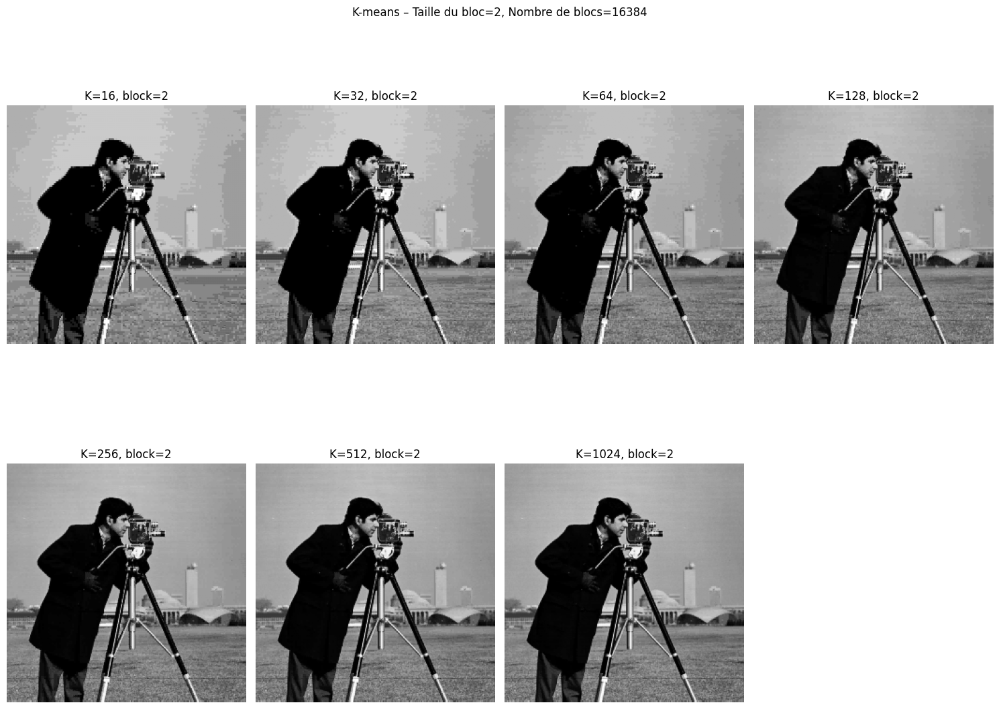

Block=4, K=16
Block=4, K=32
Block=4, K=64
Block=4, K=128
Block=4, K=256
Block=4, K=512
Block=4, K=1024


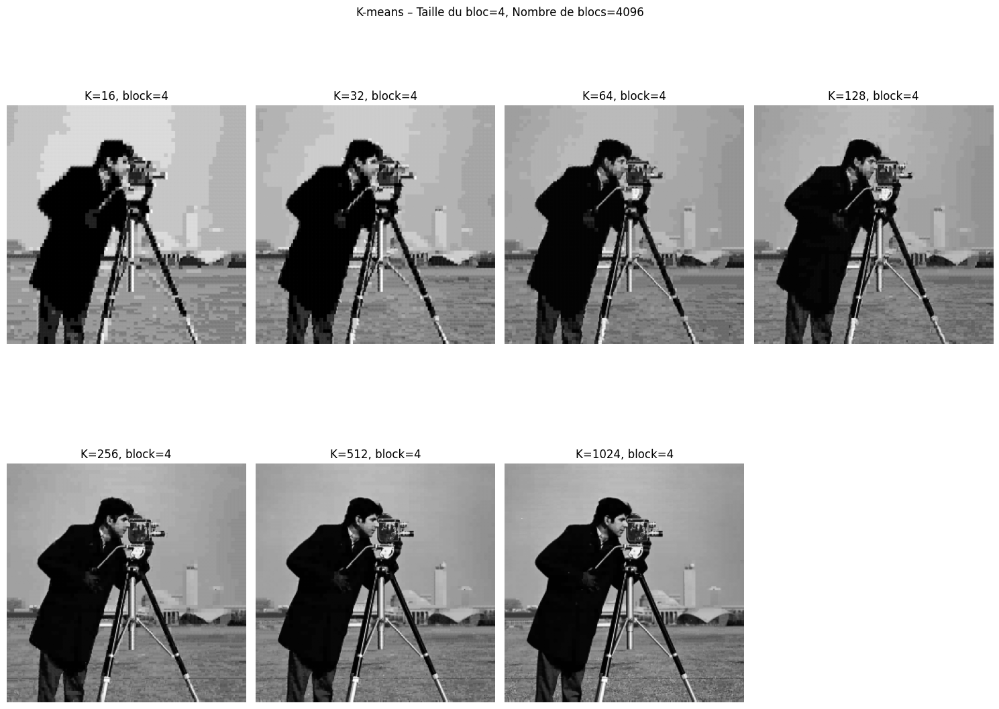

Block=8, K=16
Block=8, K=32
Block=8, K=64
Block=8, K=128
Block=8, K=256
Block=8, K=512
Block=8, K=1024


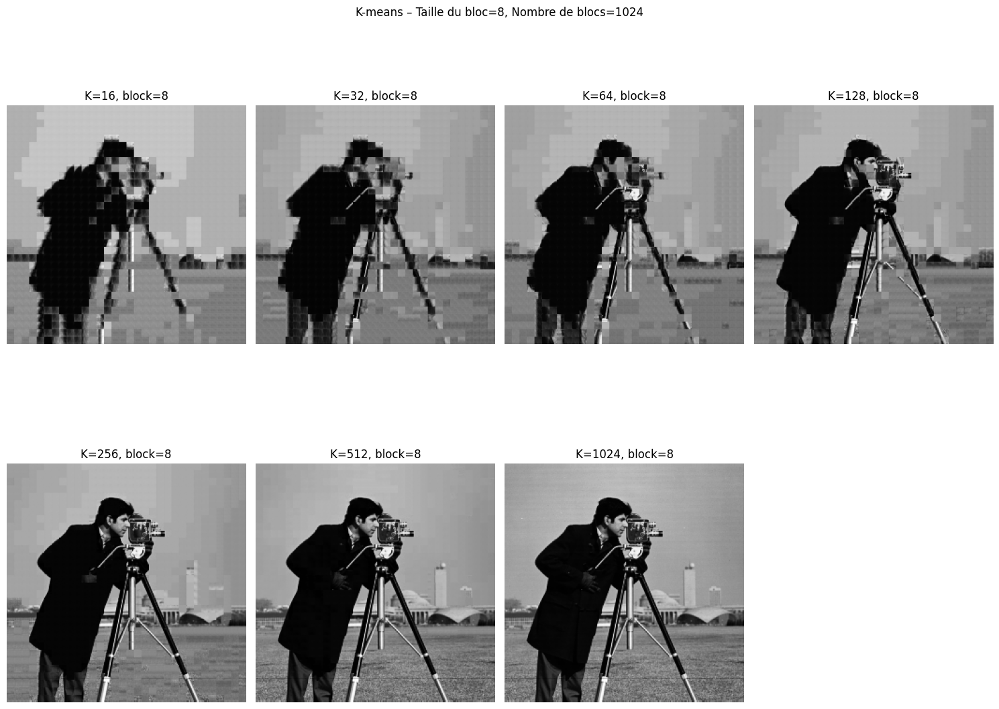

Temps d'exécution de apply_kmeans_on_image : 3.01 sec


In [12]:
chronometrer(
    apply_kmeans_on_image,
    "apply_kmeans_on_image",
    img_name="cameraman.tif",
    block_sizes=[2, 4, 8],
    K_values=[16, 32, 64, 128, 256, 512, 1024]
)

**Observations**:  
Blocs 8×8 : la qualité la plus faible, les images obtenues présentent :
- un aspect fortement « mosaïque » pour les faibles valeurs de K.
- une perte de détails importante, notamment sur le visage, les contours, et les textures du manteau.
- des zones entièrement uniformisées (ciel, sol).
- des bordures visibles entre blocs pour K ≤ 128.
- même lorsque K augmente (512 ou 1024), la reconstruction reste globalement lisse avec des artefacts visibles.

Blocs 4×4 : le meilleur compromis: 
- les détails sont nettement mieux préservés qu’en 8×8.
- les artefacts en blocs sont moins visibles.
- même avec K = 64 ou K = 128, la qualité devient déjà satisfaisante.
- à partir de K = 256, l’image est très correcte.
- à K = 512 ou 1024, la reconstruction est quasi identique à l'originale.
- 
Il semble que ce soit la zone optimale entre vitesse, compression et qualité.

Blocs 2×2 : la meilleure qualité visuelle: les images reconstruitent sont:
- visuellement proches de l’original dès K=64.
- très bien détaillées.
- propres, sans artefacts perceptibles.
- à K ≥ 256, la reconstruction est quasi parfaite.
- le découpage le plus lent en terme de temps d'exécution.

### LBG

La fonction *assign_vectors_to_codewords* assigne chaque vecteur au codeword le plus proche en calculant toutes les distances de manière vectorisée, réalisant ainsi la phase d’assignation essentielle du LBG.

In [13]:
def assign_vectors_to_codewords(vectors, codebook):
    distances = np.linalg.norm(vectors[:, None, :] - codebook[None, :, :], axis=2)
    return np.argmin(distances, axis=1)

La fonction *update_codebook* met à jour le codebook en recalculant chaque codeword comme la moyenne des vecteurs qui lui sont assignés, ce qui correspond à l’étape centrale de mise à jour du K-means/LBG.

In [14]:
def update_codebook(vectors, labels, K):
    new_codebook = np.zeros((K, vectors.shape[1]))
    for k in range(K):
        cluster_vectors = vectors[labels == k]
        if len(cluster_vectors) > 0:
            new_codebook[k] = np.mean(cluster_vectors, axis=0)
    return new_codebook

La fonction *lbg_vectorized* implémente une version rapide et vectorisée de l’algorithme LBG pour apprendre efficacement un codebook de taille K.

In [15]:
def lbg_vectorized(vectors, K, epsilon=1e-3, tol=1e-5):
    """
    LBG vectorisé (rapide) pour un codebook final de taille K.
    vectors: (N, d) N vecteurs de dimension d
    """

    codebook = np.mean(vectors, axis=0, keepdims=True)   

    while codebook.shape[0] < K:

        codebook = np.vstack([codebook*(1+epsilon), codebook*(1-epsilon)])

        while True:
            distances = np.linalg.norm(
                vectors[:, None, :] - codebook[None, :, :],
                axis=2
            )
            labels = np.argmin(distances, axis=1)

            old_distortion = np.sum((vectors - codebook[labels])**2)

            new_codebook = np.zeros_like(codebook)
            for k in range(codebook.shape[0]):
                cluster = vectors[labels == k]
                if len(cluster) > 0:
                    new_codebook[k] = cluster.mean(axis=0)
                else:
                    new_codebook[k] = codebook[k]

            codebook = new_codebook

            distances = np.linalg.norm(
                vectors[:, None, :] - codebook[None, :, :],
                axis=2
            )
            new_distortion = np.sum((vectors - codebook[labels])**2)

            if abs(old_distortion - new_distortion) < tol:
                break

    distances = np.linalg.norm(
        vectors[:, None, :] - codebook[None, :, :],
        axis=2
    )
    labels = np.argmin(distances, axis=1)

    return codebook, labels

La fonction *evaluate_lbg_on_image* teste LBG pour plusieurs valeurs de K et renvoie le PSNR pour chaque quantification.

In [16]:
def evaluate_lbg_on_image(img_name, block_size, K_values, img_folder="images/", epsilon=1e-3):

    img_original = cv2.imread(img_folder + img_name, cv2.IMREAD_GRAYSCALE).astype(np.float32)

    h, w = img_original.shape
    h_crop = h - (h % block_size)
    w_crop = w - (w % block_size)
    img_crop = img_original[:h_crop, :w_crop]

    blocks = []
    for i in range(0, h_crop, block_size):
        for j in range(0, w_crop, block_size):
            blocks.append(img_crop[i:i+block_size, j:j+block_size].flatten())

    vectors = np.array(blocks)

    mse_list = []
    psnr_list = []

    for K in K_values:

        codebook, labels = lbg_vectorized(vectors, K, epsilon=epsilon)
        reconstructed_vectors = codebook[labels]

        img_rec = np.zeros_like(img_crop)
        idx = 0
        for i in range(0, h_crop, block_size):
            for j in range(0, w_crop, block_size):
                img_rec[i:i+block_size, j:j+block_size] = \
                    reconstructed_vectors[idx].reshape(block_size, block_size)
                idx += 1

        mse = mean_squared_error(img_crop.flatten(), img_rec.flatten())
        psnr_val = compute_psnr(img_crop, img_rec)

        mse_list.append(mse)
        psnr_list.append(psnr_val)

        print(f"LBG | K={K} | MSE={mse:.4f} | PSNR={psnr_val:.2f} dB")

    return mse_list, psnr_list

L'objectif étant ici de comparer les deux algorithmes selon les d ifférentes valeurs de K, pour une taille de bloc donnée.

LBG | K=16 | MSE=130.6822 | PSNR=26.97 dB
LBG | K=32 | MSE=87.9333 | PSNR=28.69 dB
LBG | K=64 | MSE=58.1244 | PSNR=30.49 dB
LBG | K=128 | MSE=37.7301 | PSNR=32.36 dB
LBG | K=256 | MSE=24.6560 | PSNR=34.21 dB
LBG | K=512 | MSE=15.2224 | PSNR=36.31 dB
LBG | K=1024 | MSE=8.9724 | PSNR=38.60 dB


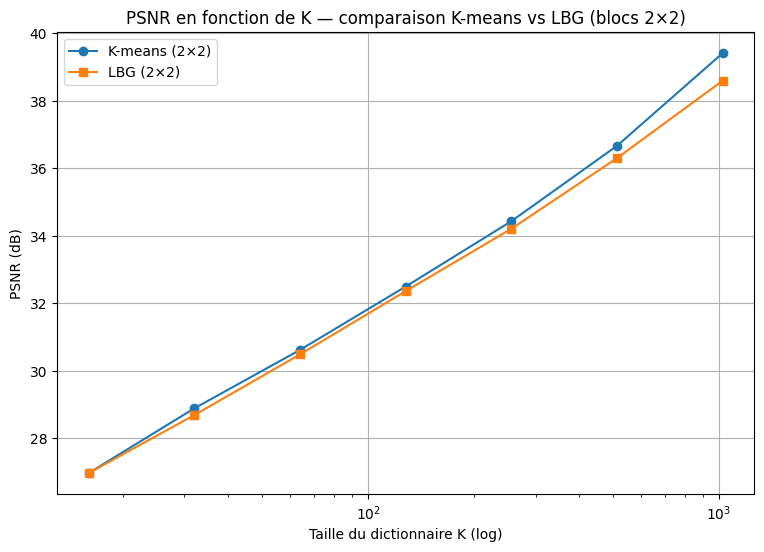

In [17]:
block_size = 2
K_values = [16, 32, 64, 128, 256, 512, 1024]

kmeans_psnr = []

for b, K, mse_value, psnr_value in results:
    if b == block_size:
        kmeans_psnr.append(psnr_value)

lbg_mse, lbg_psnr = evaluate_lbg_on_image(
    img_name="cameraman.tif",
    block_size=block_size,
    K_values=K_values
)

plt.figure(figsize=(9,6))

plt.plot(K_values, kmeans_psnr, marker='o', label="K-means (2×2)")
plt.plot(K_values, lbg_psnr, marker='s', label="LBG (2×2)")

plt.xscale("log")
plt.xlabel("Taille du dictionnaire K (log)")
plt.ylabel("PSNR (dB)")
plt.title("PSNR en fonction de K — comparaison K-means vs LBG (blocs 2×2)")
plt.grid(True)
plt.legend()
plt.show()

**Observations**:  
On constate que les deux méthodes s’améliorent régulièrement avec K, ce qui est attendu puisque un dictionnaire plus grand permet une représentation plus précise des blocs. Cependant, K-means offre systématiquement un PSNR légèrement supérieur à celui obtenu avec LBG. Il s'agit  ici évidemment d'un résultat pour une seule image, on ne peut pas généraliser.

La fonction *apply_lbg_on_image* applique LBG à une image pour différents blocs et valeurs de K, puis affiche les images reconstruites afin d’évaluer l’impact des paramètres de quantification.

In [18]:
def apply_lbg_on_image(img_name, block_sizes, K_values, img_folder="images/", epsilon=1e-3):

    img_original = cv2.imread(img_folder + img_name, cv2.IMREAD_UNCHANGED).astype(np.float32)
    print(f"Taille de l'image:{img_original.shape}pixels\n")

    if len(img_original.shape) == 2: # si image grise
        img_color = img_original[:, :, np.newaxis]
    else: # si image couleur 
        img_color = img_original

    h, w, c = img_color.shape
    
    for block_size in block_sizes:

        img = img_color.copy()
        h_crop = h - (h % block_size)
        w_crop = w - (w % block_size)
        img_crop = img[:h_crop, :w_crop, :]

        blocks = []
        for i in range(0, h_crop, block_size):
            for j in range(0, w_crop, block_size):
                blocks.append(img_crop[i:i+block_size, j:j+block_size, :].flatten())

        vectors = np.array(blocks)
        nb_blocs = vectors.shape[0]

        plt.figure(figsize=(15, 12))

        for idx_K, K in enumerate(K_values):

            print(f"block_size={block_size}, K={K}")

            codebook, labels = lbg_vectorized(vectors, K, epsilon=epsilon)
            reconstructed_vectors = codebook[labels]

            img_rec = np.zeros_like(img_crop)
            idx = 0
            for i in range(0, h_crop, block_size):
                for j in range(0, w_crop, block_size):
                    img_rec[i:i+block_size, j:j+block_size, :] = \
                        reconstructed_vectors[idx].reshape(block_size, block_size, c)
                    idx += 1

            plt.subplot(2, 4, idx_K + 1)
            if c == 1:
                plt.imshow(img_rec[:, :, 0], cmap='gray')
            else:
                plt.imshow(cv2.cvtColor(img_rec.astype(np.uint8), cv2.COLOR_BGR2RGB))
            plt.title(f"block_size={block_size}, K={K}")
            plt.axis("off")

        plt.suptitle(f"LBG – Taille du bloc={block_size}, Nombre de blocs={nb_blocs}")
        plt.tight_layout()
        plt.show()

Taille de l'image:(256, 256)pixels

block_size=2, K=16
block_size=2, K=32
block_size=2, K=64
block_size=2, K=128
block_size=2, K=256
block_size=2, K=512
block_size=2, K=1024


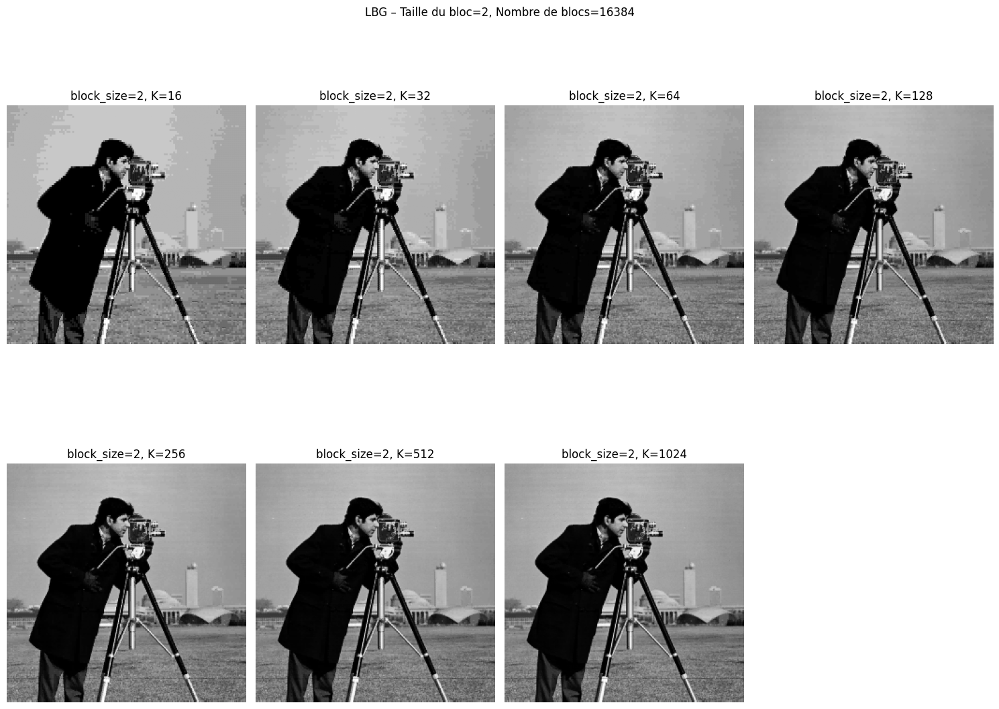

block_size=4, K=16
block_size=4, K=32
block_size=4, K=64
block_size=4, K=128
block_size=4, K=256
block_size=4, K=512
block_size=4, K=1024


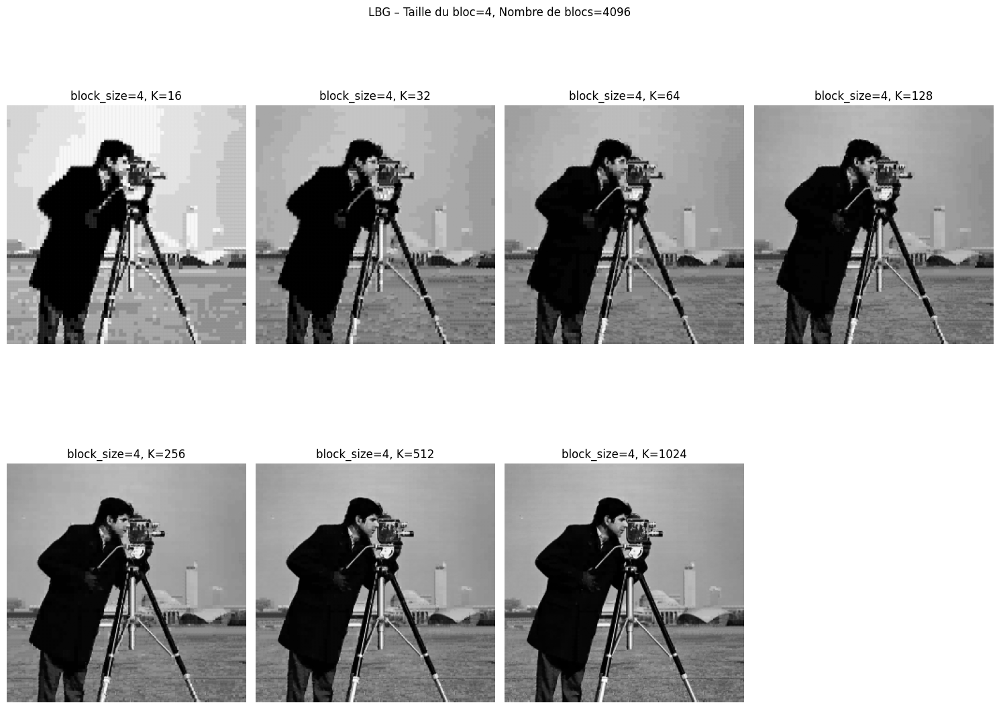

block_size=8, K=16
block_size=8, K=32
block_size=8, K=64
block_size=8, K=128
block_size=8, K=256
block_size=8, K=512
block_size=8, K=1024


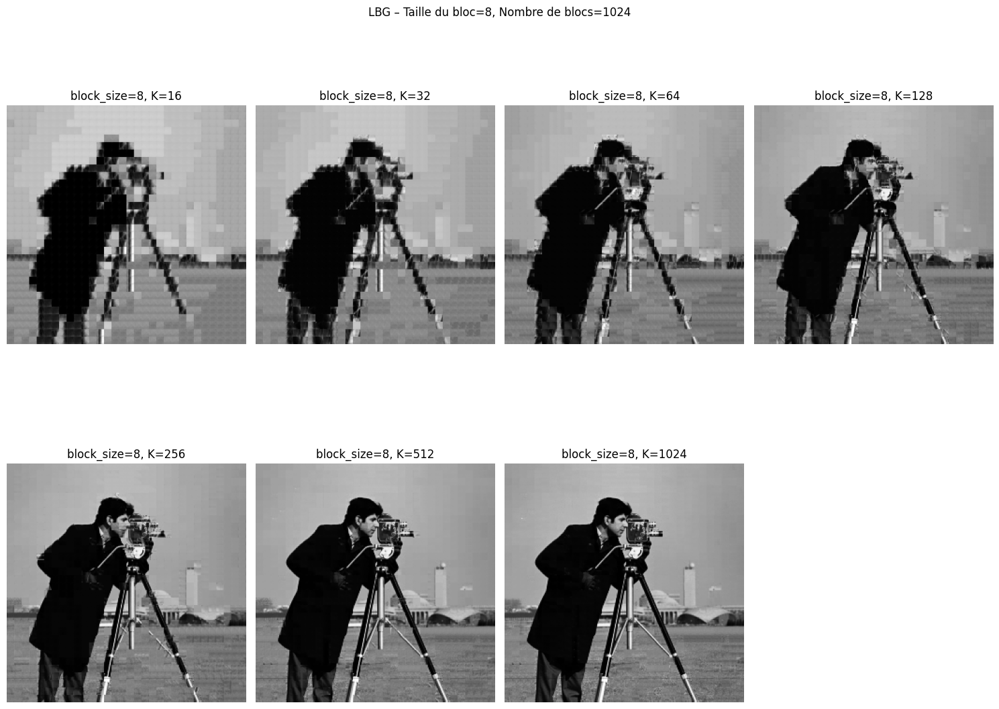

Temps d'exécution de apply_lbg_on_image : 231.51 sec


In [19]:
chronometrer(
    apply_lbg_on_image,
    "apply_lbg_on_image",
    img_name="cameraman.tif",
    block_sizes=[2, 4, 8],
    K_values=[16, 32, 64, 128, 256, 512, 1024]
)

**Observations**:  
L’algorithme LBG est significativement plus lent que K-means classique, car il construit le codebook de manière progressive et exécute ainsi plusieurs phases complètes d’assignation et de mise à jour pour chaque valeur de K.  
Dans nos expériences, LBG a été appliqué pour trois tailles de blocs et sept valeurs de K, soit 21 apprentissages complets. Comme chaque apprentissage implique le calcul de matrices de distances de grande taille et plusieurs itérations jusqu’à convergence, un temps total d’environ 240 secondes est parfaitement normal et cohérent avec la complexité de l’algorithme.

### Application à une image couleur de plus grandes dimensions

**K-means**

Block=2, K=16
Block=2, K=32
Block=2, K=64
Block=2, K=128
Block=2, K=256
Block=2, K=512
Block=2, K=1024


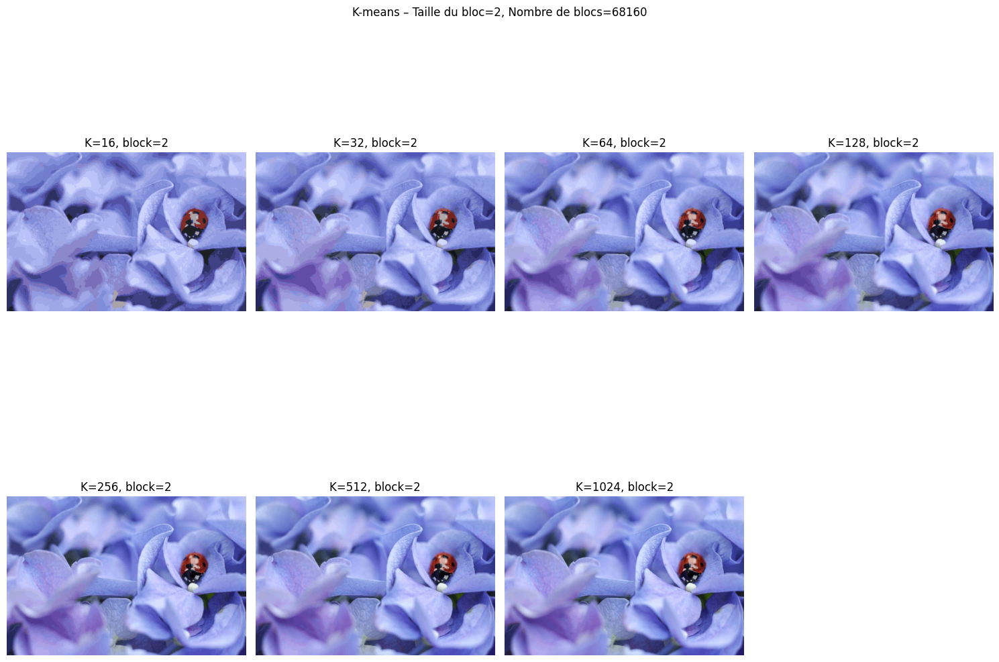

Block=4, K=16
Block=4, K=32
Block=4, K=64
Block=4, K=128
Block=4, K=256
Block=4, K=512
Block=4, K=1024


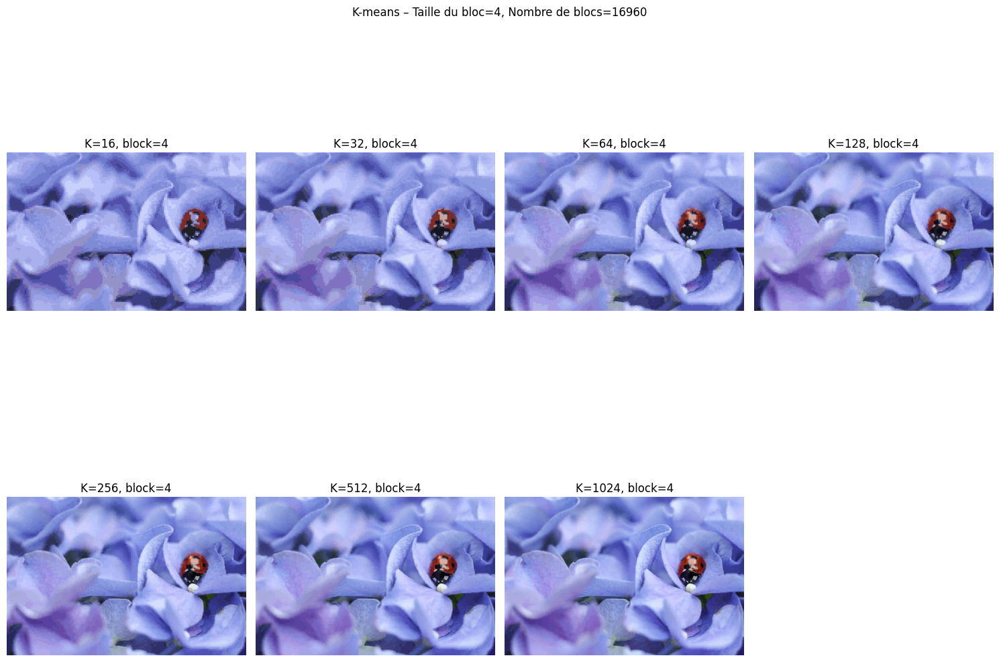

Block=8, K=16
Block=8, K=32
Block=8, K=64
Block=8, K=128
Block=8, K=256
Block=8, K=512
Block=8, K=1024


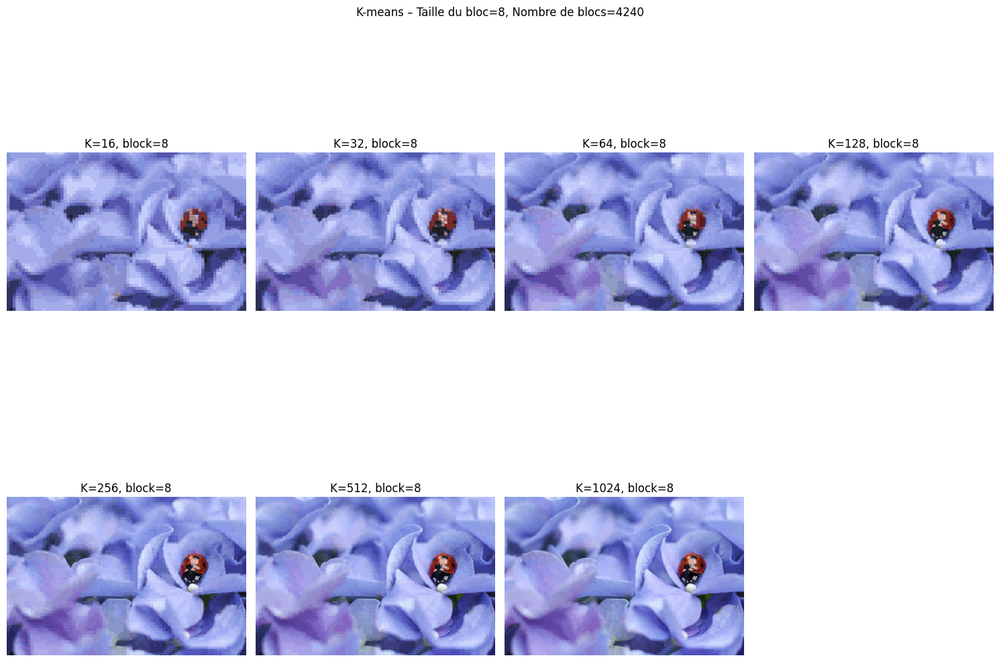

Block=16, K=16
Block=16, K=32
Block=16, K=64
Block=16, K=128
Block=16, K=256
Block=16, K=512
Block=16, K=1024


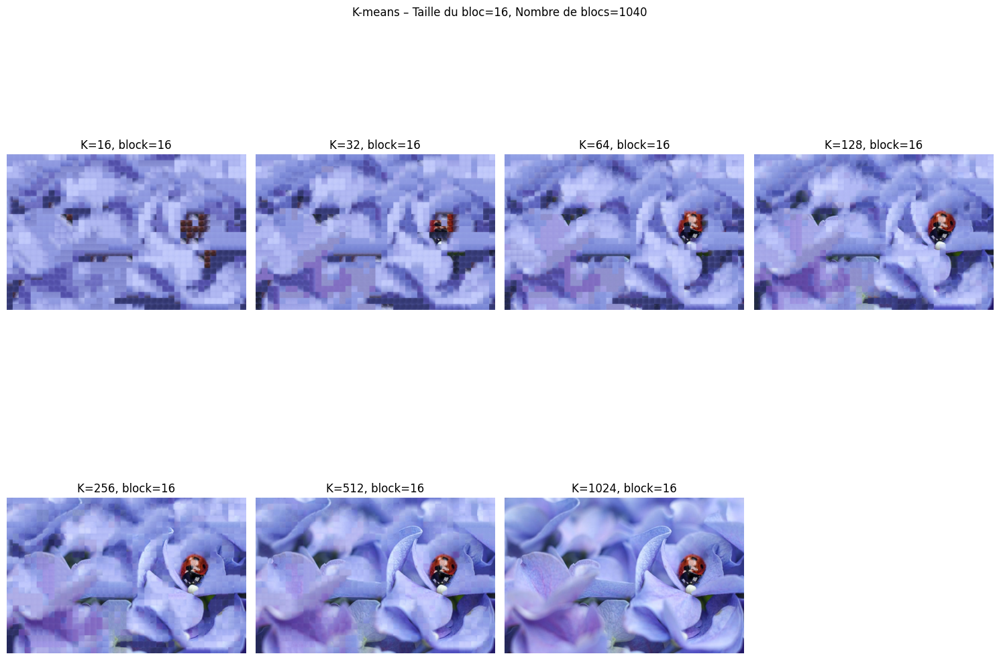

Temps d'exécution de apply_kmeans_on_image : 15.45 sec


In [20]:
chronometrer(
    apply_kmeans_on_image,
    "apply_kmeans_on_image",
    img_name="violet.jpg",
    block_sizes=[2, 4, 8, 16],
    K_values=[16, 32, 64, 128, 256, 512, 1024]
)

Lorsque la quantification vectorielle est appliquée avec des blocs de petite taille (2×2 ou 4×4), les pertes visuelles sont très faibles, même pour des valeurs de K relativement petites. Les blocs couvrent de petites zones homogènes et la quantification reconstruit donc l’image avec une grande fidélité. Ainsi, la différence entre K=16 et K=512 est peu perceptible.  

En revanche, avec des blocs de grande taille (16×16), la compression devient beaucoup plus visible. Pour K ≤ 64, l’image présente un effet marqué de mosaïque, avec dégradation des couleurs et perte de détails. Ce n’est qu’à partir de K ≈ 256 que la reconstruction redevient de bonne qualité, et qu’un codebook très large (K = 512 ou 1024) permet d’obtenir une image presque indiscernable de l’originale.

**LBG**

Taille de l'image:(427, 640, 3)pixels

block_size=4, K=16
block_size=4, K=32
block_size=4, K=64
block_size=4, K=128
block_size=4, K=256
block_size=4, K=512


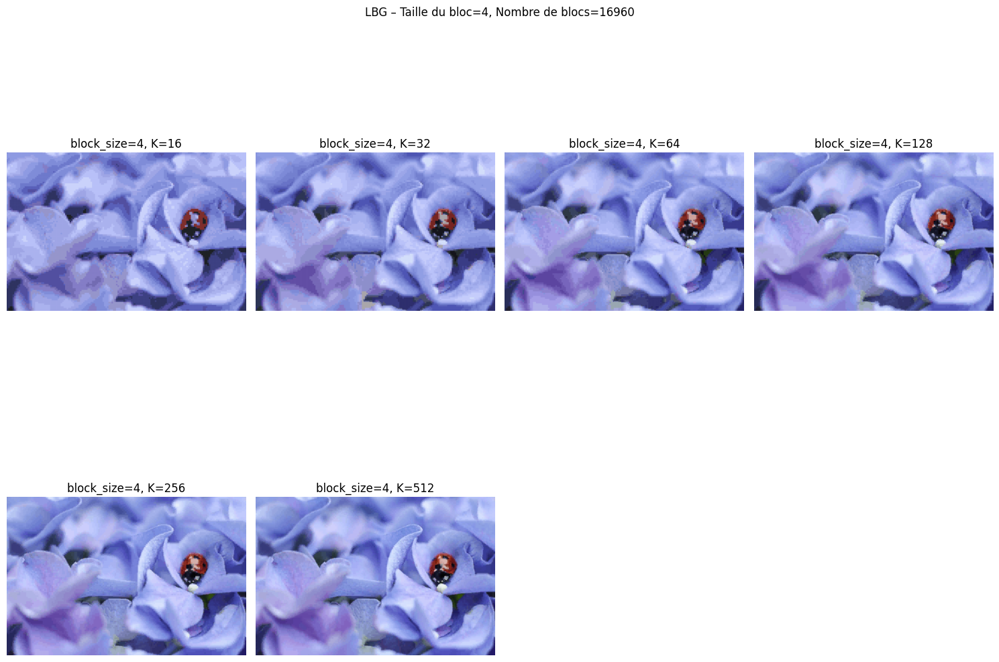

block_size=16, K=16
block_size=16, K=32
block_size=16, K=64
block_size=16, K=128
block_size=16, K=256
block_size=16, K=512


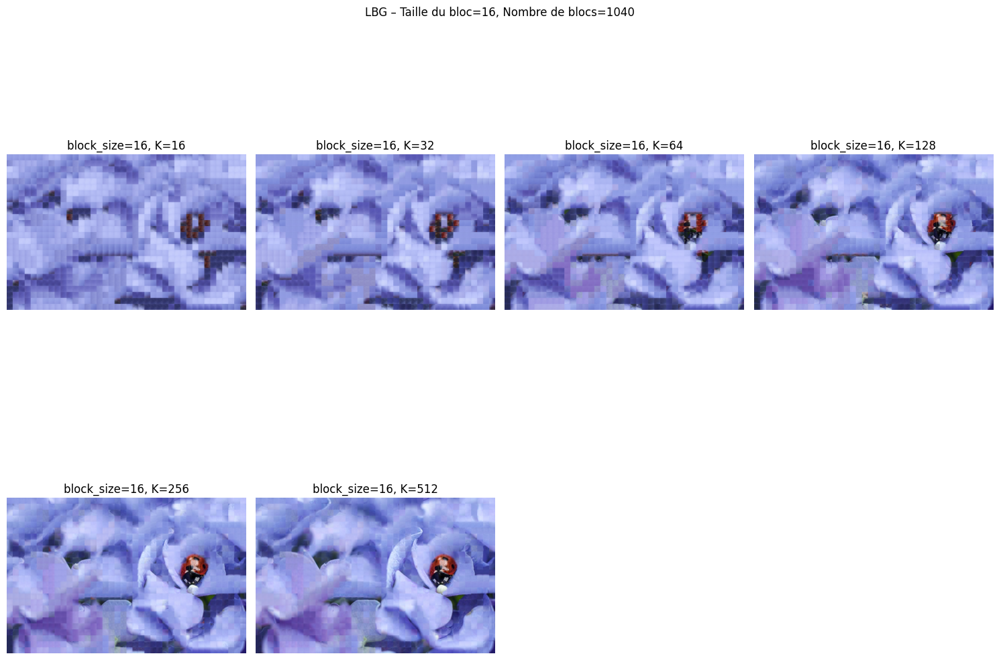

Temps d'exécution de apply_lbg_on_image : 491.06 sec


In [21]:
chronometrer(
    apply_lbg_on_image,
    "apply_lbg_on_image",
    img_name="violet.jpg",
    block_sizes=[4,16],
    K_values=[16, 32, 64, 128, 256, 512]
)

Avec l’algorithme LBG, les blocs petits (4×4) donnent de bonnes reconstructions même pour des valeurs de K faibles, car ils capturent des zones locales homogènes. En revanche, les blocs grands (16×16) génèrent des artefacts importants lorsque K est faible : l’image devient très mosaïquée et perd en détail. La qualité ne devient satisfaisante qu’à partir de K ≈ 128, et n’approche l’original qu’avec K ≥ 256. Cela montre que LBG nécessite un codebook plus large lorsque la taille des blocs augmente.

**Conclusion**:  
Même si K-means est beaucoup plus rapide et produit souvent de meilleurs résultats, l’algorithme LBG reste préférable pour l’apprentissage du codebook, car il évite les mauvaises initialisations, construit progressivement des centres mieux répartis, réduit le risque de clusters vides et fournit généralement une distorsion plus faible. LBG offre ainsi un codebook plus stable, plus représentatif et mieux adapté à la quantification vectorielle.  Les différences entre LBG et K-means deviennent plus nettes lorsque K est petit, lorsque la taille des blocs augmente, ou lorsque l’image comporte davantage de motifs variés.

## Tree-Structured Vector Quantization (TSVQ)

La **quantification vectorielle tree-structured (TSVQ)** est une méthode hiérarchique de construction de codebook, **conçue pour accélérer l’encodage tout en conservant une structure de quantification cohérente**. Contrairement à K-means ou LBG, qui produisent un codebook "plat" où tous les codewords sont comparés simultanément, **TSVQ organise les vecteurs-code sous la forme d’un arbre binaire**.
Cette structure permet d’effectuer l’assignation d’un vecteur en O(log₂ K) au lieu de O(K), ce qui rend la quantification beaucoup plus rapide, en particulier lorsque le codebook est de grande taille. TSVQ repose sur une stratégie de partitionnement successif: à chaque étape, l’espace des vecteurs est divisé en deux sous-espaces distincts, jusqu’à atteindre un nombre de feuilles égal à K.
L’algorithme suit généralement les étapes suivantes :

1) **Initialisation**:  
On commence avec l’ensemble complet des vecteurs blocs de l'image. Un unique nœud racine représente cet ensemble. Comme pour K-means, on peut calculer une moyenne globale, mais son rôle est surtout symbolique : ce nœud servira de point de départ pour les divisions successives.

2) **Division binaire de l'espace  (split hiérarchique)**:  
À partir du nœud courant, on divise l’ensemble des vecteurs en deux groupes distincts. Cette division peut être réalisée par:
- un K-means restreint à K=2.
- une séparation sur une dimension discriminante comme la PCA.

Chaque noeud génère toujours deux enfants correspondant à deux sous-espaces.

3) **Assignation locale (clustering binaire)**:
Comme pour un mini K-means à K = 2, chaque vecteur du nœud est assigné au centre le plus proche parmi les deux centres créés.

4) **Mise à jour des centres**:  
Pour chaque branche, on met à jour le centre associé en calculant la moyenne des vecteurs qui lui ont été assignés.
Ces centres deviennent les vecteurs-code temporaires des deux enfants du nœud.
Ils guideront la prochaine division (split) si l’arbre doit être approfondi.

5) **Récursion jusqu'à obtenir K feuilles**:  
L’algorithme répète les étapes 2, 3 et 4 pour chaque nœud qui n’est pas encore une feuille, jusqu’à produire exactement K feuilles, chacune représentant un vecteur-code final.

Avantages de cet algorithme:  
- Encodage très rapide : la structure en arbre permet de classifier un vecteur en log₂(K) comparaisons au lieu de K.
- Complexité réduite : la méthode reste efficace même avec des codebooks très grands.
- Structure hiérarchique claire : l’arbre révèle naturellement la façon dont l’espace des vecteurs est partitionné.
- Adaptée au temps réel : la faible complexité en fait une option idéale pour les systèmes embarqués ou rapides.

Inconvénients de cet algorithme: 
- Qualité moins optimale : le codebook obtenu est généralement moins performant que celui produit par K-means ou LBG.
- Structure imposée : l’arbre binaire force des divisions successives qui ne correspondent pas toujours à la meilleure partition des données.
- Sensibilité aux premières divisions : une mauvaise séparation initiale affecte toute la hiérarchie et donc la qualité finale.

## Product Quantization (PQ)

La **Product Quantization (PQ)** est une méthode avancée de quantification vectorielle **conçue pour réduire drastiquement le coût mémoire tout en permettant de manipuler des vecteurs de très grande dimension**.
Contrairement à K-means ou LBG, qui quantifient un vecteur entier à l’aide d’un seul codebook, **PQ découpe chaque vecteur en plusieurs sous-vecteurs indépendants, et apprend un codebook distinct pour chacun d’eux**.
Cette décomposition **transforme un problème de quantification complexe en plusieurs petites quantifications plus simples**, ce qui permet d’obtenir des représentations extrêmement compactes tout en préservant l’information essentielle.

1) **Découpage du vecteur en sous-vecteurs**:  
Chaque vecteur d’origine est découpé en plusieurs sous-vecteurs plus petits, placés côte à côte et sans recouvrement.

2) **Apprentissage de codebooks locaux**:  
Pour chaque sous-espace, on apprend un codebook indépendant (souvent via un K-means classique). Ainsi, l’ensemble des vecteurs est quantifié dans plusieurs petites parties plutôt que dans un seul espace global.
Chaque codebook devient expert d’une zone locale et capture mieux les variations spécifiques de son sous-vecteur.

3) **Quantification indépendante dans chaque sous-espace**:  
Chaque sous-vecteur est remplacé par l’index du vecteur-code le plus proche dans son codebook local.
L’encodage complet d’un vecteur consiste donc simplement à concaténer m indices, un par sous-espace.
Cette quantification factorisée rend PQ extrêmement compact et rapide.

4) **Reconstruction par combinaison des codewords**:  
Pour reconstruire le vecteur approximé, on remplace chaque sous-vecteur quantifié par son vecteur-code correspondant, puis on concatène les sous-vecteurs reconstruits.
La combinaison de ces codewords locaux forme une approximation globale du vecteur original.

Avantages de cet algorithme:  
- Très forte compression : PQ permet de représenter des vecteurs de grande dimension avec seulement quelques indices, ce qui réduit drastiquement la mémoire nécessaire.
- Apprentissage simplifié : plusieurs petits codebooks sont plus faciles et plus rapides à entraîner qu’un seul codebook global de grande dimension.
- Recherche rapide : PQ permet d’accélérer la recherche de similarité en utilisant des distances approximées pré-calculées.

Inconvénients de cet algorithme: 
- Perte de précision : la quantification indépendante de chaque sous-espace entraîne une reconstruction moins précise qu’une quantification globale.
- Dépendance au découpage : un mauvais choix de segmentation des vecteurs peut dégrader fortement la qualité.
- Pas optimisé à l’échelle globale : l’approximation étant factorisée, PQ ne capture pas les corrélations entre sous-vecteurs, ce qui limite la qualité maximale atteignable.

## Tableau résumé comparatif des différents algorithmes

| Critère                                   | K-means                                                  | LBG                                                      | TSVQ                                                         | PQ                                         |
|-------------------------------------------|-----------------------------------------------------------|-----------------------------------------------------------|----------------------------------------------------------------|------------------------------------------------------------------------|
| **Type de quantification**                | Globale                                                  | Globale avec expansion progressive du codebook                     | Hiérarchique (arbre binaire)                                 | Factorisée (sous-vecteurs indépendants)                              |
| **Qualité de reconstruction**             | Bonne mais dépend de l'initialisation                    | Très bonne grâce au split contrôlé                       | Moins optimale (structure imposée)                           | Plus faible car perd les corrélations globales                         |
| **Adapté aux grandes dimensions ?**       | Peu adapté                                               | Peu adapté                                               | Modérément adapté                                            | Spécialement conçu pour la haute dimension                             |
| **Coût mémoire**                          | Moyen                                                    | Élevé                                                    | Moyen                                                       | Très faible                                                           |
| **Temps d’apprentissage**                 | Moyen                                                    | Lent (multiples splits)                                   | Moyen                                                       | Rapide                                                                |
| **Temps d’encodage**                      | Lent                           | Lent                | Très rapide                              | Très rapide                                 |
| **Structure du codebook**                 | Plate                                                    | Plate                                                    | Arbre binaire                                                | Plusieurs petits codebooks indépendants                               |
| **Applications réels**                 | Compression simple, clustering                           | Compression d’image/audio de haute qualité               | Systèmes temps réel, embarqués                                | Indexation massive, recherche de similarité, big data                 |
| **Quand le choisir ?**                    |  Simplicité et flexibilité                   |  Qualité prioritaire                          | Rapidité d’encodage                 | Gérer des millions de vecteurs haute dimension          |
| **Complexité**                            | Quadratique | Quadratique | Logarithmique | Linéaire |

# Exemples d'utilisation de la quantification vectorielle

**Compression d’images**:  
La QV a été utilisée dans plusieurs systèmes de compression d’images, en particulier avant la généralisation du JPEG. Elle servait principalement à coder efficacement de petits blocs d’image à partir d’un codebook appris.

**Codage de la parole et de l’audio**:  
Dans le domaine du codage audio bas débit, la QV est largement utilisée pour compresser des vecteurs de paramètres acoustiques. Les coefficients LPC ou MFCC, par exemple, sont souvent quantifiés sous forme vectorielle. La quantification vectorielle permet de réduire drastiquement le nombre de bits nécessaires pour transmettre la parole tout en maintenant une intelligibilité suffisante. Exemples: 
- anciens standards GSM.
- codage de la voix sur IP et systèmes de communication à faibles débits.

**Compression de textures dans les moteurs 3D**:  
Les textures utilisées dans les applications 3D occupent une part importante de la mémoire vidéo. Pour les réduire, certaines architectures graphiques ont utilisé la QV pour encoder les textures par blocs. Exemples: 
- moteurs graphiques de consoles plus anciennes. Par exemple, le jeu "Mario 64" sur Nintendo 64 utilise la QV.
- compression de textures dans des moteurs 3D embarqués.

**Reconnaissance de formes et approche “Bag-of-Visual-Words”**:  
En vision par ordinateur, la QV joue un rôle central dans les approches dites Bag-of-Visual-Words. On extrait d’abord des descripteurs locaux (SIFT, SURF, ORB), puis on construit un codebook par clustering (souvent via K-means). Chaque image peut ensuite être représentée comme un histogramme de mots visuels. Exemples:
- construction d'un dictionnaire de descripteurs locaux (SIFT, SURF, etc.) par K-means.
- reconnaissance d’objets ou de scènes.
- recherche d’images par similarité.

**Indexation de grands espaces de descripteurs**:  
Avec l’augmentation des volumes de données visuelles, il est nécessaire d’indexer des millions de descripteurs, on peut utiliser l'algorithme PQ pour cela. Exemples:
- recherche d’images à grande échelle (Approximate Nearest Neighbors).
- indexation de milliards de vecteurs (ex. FAISS, utilisé par Meta/Facebook).
- traitement de données massives dans les systèmes de recommandation ou de vision.
- calcul rapide de distances approximatives en base de données.

**Compression et quantification de réseaux de neurones**:  
Avec la croissance des modèles de deep learning, la compression est devenue un enjeu majeur. La QV est utilisée pour réduire la taille mémoire des réseaux en quantifiant vectoriellement les poids ou certaines activations.

Ces cas d'utilisation montrent que la quantification vectorielle est une méthode polyvalente, encore largement utilisée dans des domaines très variés: compression d’images et de textures, codage audio, reconnaissance de formes, recherche à grande échelle et optimisation de modèles neuronaux.

# Conclusion

Ce projet nous a permis de relier des notions théoriques (quantification scalaire et vectorielle, distorsion, clustering) à une implémentation pratique en traitement d'images.
Nous avons implémenté plusieurs approches de quantification vectorielle (K-means, LBG), analysé l’influence de la taille des blocs et du codebook, et évalué la qualité de reconstruction via MSE et PSNR.
Ces expériences ont mis en évidence les compromis entre qualité, complexité de calcul et taille du dictionnaire, caractéristiques essentielles de la quantification vectorielle.
Enfin, ce travail s'est étendu à travers la découverte de méthodes plus avancées (TSVQ, PQ) et vers leurs nombreuses applications en compression, indexation, reconnaissance et apprentissage profond.